# Alkemy project - Maria Cicone, Andrea Buscemi, Alessandro Ponzianelli, Carlamaria Sciammarella

In [1]:
import pandas as pd
import numpy as np
import sqlite3
import matplotlib.pyplot as plt
import seaborn as sns
import pyspark
import plotly.express as px

In [2]:
## Creating a SparkSession
from pyspark.sql import SparkSession


spark = SparkSession.builder.appName("Alkemy App").enableHiveSupport().getOrCreate()
spark

In [3]:
##Creating a database
spark.sql("CREATE DATABASE IF NOT EXISTS sales_db")

DataFrame[]

In [4]:
#Checking if the database exists
v=spark.sql("show databases")
v.show()

+---------+
|namespace|
+---------+
|  default|
| sales_db|
+---------+



In [5]:
###Creating schema for the tables

from pyspark.sql.types import *

stock_schema=StructType([
        StructField("stock_date", DateType(), nullable=False),
        StructField("product_id", StringType(), nullable=False),
        StructField("total_stock", IntegerType(), nullable=False) ])

clicks_schema= StructType([
        StructField("date", TimestampType(), nullable=False),
        StructField("seller", StringType(), nullable=False),
        StructField("position", IntegerType(), nullable=False),
        StructField("price_max", DoubleType(), nullable=False),
        StructField("price_min", DoubleType(), nullable=False),
        StructField("price", DoubleType(), nullable=False),
        StructField("type", StringType(), nullable=False),
        StructField("product_id", StringType(), nullable=False) ])

sellers_schema= StructType([
        StructField("seller_id", StringType(), nullable=False),
        StructField("seller_name", StringType(), nullable=False)])

catalog_schema= StructType([
        StructField("product_id", StringType(), nullable=False),
        StructField("coded_cat1", StringType(), nullable=False),
        StructField("coded_cat2", StringType(), nullable=False),
        StructField("coded_cat3", StringType(), nullable=False),
        StructField("coded_brand", StringType(), nullable=False),
        StructField("coded_name", StringType(), nullable=False)])

competitor_schema= StructType([
        StructField("comp_date", DateType(), nullable=False),
        StructField("seller_id", StringType(), nullable=False),
        StructField("product_id", StringType(), nullable=False),
        StructField("price", DoubleType(), nullable=False) ])

sales_schema= StructType([
        StructField("sale_date", DateType(), nullable=False),
        StructField("product_id", StringType(), nullable=False),
        StructField("quantity", IntegerType(), nullable=False),
        StructField("sales_price_tax", DoubleType(), nullable=False),
        StructField("regular_price_tax", DoubleType(), nullable=False),
        StructField("sales_price", DoubleType(), nullable=False),
        StructField("regular_price", DoubleType(), nullable=False),
        StructField("purchase_price", DoubleType(), nullable=False)])


In [6]:
##Reading the datasets
stock = spark.read.option("header",True).schema(stock_schema).csv("stock.csv")
clicks_b = spark.read.option("header",True).schema(clicks_schema).csv("clicks_bidding.csv")
clicks_r = spark.read.option("header",True).schema(clicks_schema).csv("clicks_regular.csv")
sellers = spark.read.option("header",True).schema(sellers_schema).csv("sellers_list.csv")
catalog = spark.read.option("header",True).schema(catalog_schema).csv("product_catalog.csv")
competitor = spark.read.option("header",True).schema(competitor_schema).csv("prices_competitor.csv")
sales = spark.read.option("header",True).schema(sales_schema).csv("sales_data.csv")

In [7]:
##Adding seller_id specification to our client
from pyspark.sql.functions import lit
sales=sales.withColumn("seller_id", lit(24))

## Cleaning the dataframes

### Prices_competitor

In [8]:
#prices_competitor

##Checking for missing values, duplicates or outliers in the prices set
from pyspark.sql.functions import *

competitor.filter(competitor.price.isNull()).count()

0

In [9]:
competitor.count()

8473036

In [10]:
competitor.distinct().count()
####There are no absolute duplicates, even if prices are set multiple times in the same day by the same seller

8473036

In [11]:
competitor.filter(competitor.price== 0).show()  ##Remove 0 values

+----------+---------+----------+-----+
| comp_date|seller_id|product_id|price|
+----------+---------+----------+-----+
|2021-06-01|      490|    141568|  0.0|
|2021-06-02|      490|    106121|  0.0|
|2021-06-02|      490|    106122|  0.0|
|2021-06-02|      490|    108922|  0.0|
|2021-06-02|      490|    107693|  0.0|
+----------+---------+----------+-----+



In [12]:
##Looking for outliers by comparing mean vs median
out1= competitor.groupBy(["product_id", "seller_id"]).agg(mean('price').alias("mean"), percentile_approx("price", 0.5).alias("median"))

In [13]:
px.scatter(data_frame=out1.toPandas(), x="mean", y="median", trendline="ols", color_discrete_sequence=['royalblue'], title="Price Set by Competitors - Mean vs Median Per Product ID and Seller")

In [14]:
##Finding the outlier
out1.filter(out1.median == 107936).show(truncate=False)

+----------+---------+------------------+--------+
|product_id|seller_id|mean              |median  |
+----------+---------+------------------+--------+
|164429    |41       |143181.09701492538|107936.0|
+----------+---------+------------------+--------+



In [15]:
outlier=competitor.filter((out1.seller_id == 41) & (out1.product_id == 164429))

In [16]:
px.histogram(outlier.toPandas(), x="price", title="Distribution of price - Product 164429/Seller 41")

In [17]:
outlier.sort(outlier.price.desc()).show()

+----------+---------+----------+---------+
| comp_date|seller_id|product_id|    price|
+----------+---------+----------+---------+
|2021-04-04|       41|    164429|1040290.0|
|2021-04-02|       41|    164429|1040290.0|
|2021-04-05|       41|    164429|1040290.0|
|2021-04-03|       41|    164429|1040290.0|
|2021-04-06|       41|    164429|1040290.0|
|2021-01-02|       41|    164429| 119990.0|
|2021-01-01|       41|    164429| 119990.0|
|2021-01-07|       41|    164429| 119990.0|
|2021-01-09|       41|    164429| 119990.0|
|2021-01-11|       41|    164429| 119990.0|
|2021-01-03|       41|    164429| 119990.0|
|2021-01-06|       41|    164429| 119990.0|
|2021-01-08|       41|    164429| 119990.0|
|2021-01-10|       41|    164429| 119990.0|
|2021-01-12|       41|    164429| 119990.0|
|2021-01-04|       41|    164429| 119990.0|
|2021-01-05|       41|    164429| 119990.0|
|2021-03-24|       41|    164429| 114103.0|
|2021-03-23|       41|    164429| 112973.0|
|2021-03-24|       41|    164429

In [18]:
outlier.filter(outlier.comp_date=="2021-04-02").show() ###It is likely a typo, there is an additional 0

+----------+---------+----------+---------+
| comp_date|seller_id|product_id|    price|
+----------+---------+----------+---------+
|2021-04-02|       41|    164429| 103158.0|
|2021-04-02|       41|    164429| 104200.0|
|2021-04-02|       41|    164429|1040290.0|
+----------+---------+----------+---------+



In [19]:
###Correcting the typo
competitor = competitor.withColumn("price", when((competitor.price == 1040290) & (competitor.product_id==164429),104290).otherwise(competitor.price))

In [20]:
###Dropping rows with 0 price values
competitor=competitor.filter(competitor.price!=0)

### Sales_data

In [21]:
#sales
sales.filter(sales.regular_price.isNull()).count() ###0
sales.count()

119125

In [22]:
sales.distinct().count() ###No duplicates

119125

In [23]:
sales.filter(sales.regular_price== 0).show() ##Empty

+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
|sale_date|product_id|quantity|sales_price_tax|regular_price_tax|sales_price|regular_price|purchase_price|seller_id|
+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+



In [24]:
##Looking for outliers - Regular Price
out2= sales.groupBy("product_id").agg(mean('regular_price').alias("mean"), percentile_approx("regular_price", 0.5).alias("median"))

In [25]:
px.scatter(data_frame=out2.toPandas(), x="mean", y="median", trendline="ols", color_discrete_sequence=['royalblue'], title="Regular Price - Mean vs Median Per Product ID")

In [26]:
sales.filter(sales.sales_price.isNull()).count() ##0

0

In [27]:
sales.filter(sales.sales_price== 0).show() #Empty

+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
|sale_date|product_id|quantity|sales_price_tax|regular_price_tax|sales_price|regular_price|purchase_price|seller_id|
+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+



In [28]:
###Looking for outliers --- sales_price
out3= sales.groupBy("product_id").agg(mean('sales_price').alias("mean"), percentile_approx("sales_price", 0.5).alias("median"))

In [29]:
px.scatter(data_frame=out3.toPandas(), x="mean", y="median", trendline="ols", color_discrete_sequence=['royalblue'], title="Sale Price - Mean vs Median Per Product ID")

In [30]:
##Finding the hypothetical outlier
out3.filter(out3.median == 291658).show(truncate=False)

+----------+--------+--------+
|product_id|mean    |median  |
+----------+--------+--------+
|163731    |334015.0|291658.0|
+----------+--------+--------+



In [31]:
sales.filter(sales.purchase_price.isNull()).count() ##0

0

In [32]:
sales.filter(sales.purchase_price== 0).show() ##Empty

+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
|sale_date|product_id|quantity|sales_price_tax|regular_price_tax|sales_price|regular_price|purchase_price|seller_id|
+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
+---------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+



In [33]:
###Looking for outliers ---purchase price
out4= sales.groupBy("product_id").agg(mean('purchase_price').alias("mean"), percentile_approx("purchase_price", 0.5).alias("median"))
px.scatter(data_frame=out4.toPandas(), x="mean", y="median", trendline="ols", color_discrete_sequence=['royalblue'], title="Purchase Price - Mean vs Median Per Product ID")

In [34]:
out4.filter(out4.median>272000 ).show(truncate=False)

+----------+-------------+-----------+
|product_id|mean         |median     |
+----------+-------------+-----------+
|163731    |306754.119375|272171.3907|
+----------+-------------+-----------+



In [35]:
outlier_sales=sales.filter(sales.product_id ==163731)

In [36]:
outlier_sales.show() ###The sales_price reacted to changes in the purchase_price, therefore there is no outlier

+----------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
| sale_date|product_id|quantity|sales_price_tax|regular_price_tax|sales_price|regular_price|purchase_price|seller_id|
+----------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+
|2021-09-14|    163731|       1|       449990.0|         533322.0|   374992.0|  444435.1852|   341077.8032|       24|
|2021-10-04|    163731|       1|       453303.0|         533322.0|   377752.0|  444435.1852|   341595.8929|       24|
|2021-11-27|    163731|       1|       349990.0|         533322.0|   291658.0|  444435.1852|   272171.3907|       24|
|2021-11-30|    163731|       1|       349990.0|         533322.0|   291658.0|  444435.1852|   272171.3907|       24|
+----------+----------+--------+---------------+-----------------+-----------+-------------+--------------+---------+



In [37]:
###Dropping variables we are not going to use
column_sales=["regular_price_tax", "sales_price_tax"]
sales=sales.drop(*column_sales)

### Clicks_regular and clicks_bidding

In [38]:
#clicks_regular
##Missing values
clicks_r.filter(clicks_r.price.isNull()).count() ## 1093244  ###DROP

1093244

In [39]:
clicks_r.count()

2252931

In [40]:
clicks_r.distinct().count()
###We decided not to drop the duplicates as the user_id is not mentioned and it is possible for different users to click on the same insertion at the same time

2250855

In [41]:
##Missing values
clicks_b.filter(clicks_b.price.isNull()).count() ###0

0

In [42]:
clicks_b.count()

696999

In [43]:
clicks_b.distinct().count() ###We decided to keep the duplicates for the same reason we mentioned above

695429

In [44]:
###Dropping the price column from the click dataframes, as it has a lot of missing values and it is redundant, since price is listed in the prices_competitor dataframe
##Dropping price_max and price_min, as well as the position, as they are inconsistent and not useful for our analysis
click_columns=["price", "price_max", "price_min", "position"]
clicks_b=clicks_b.drop(*click_columns)
clicks_r=clicks_r.drop(*click_columns)

### Inserting the tables in the database

In [45]:
### Converting the dataframes into tables of our database ###Overwrite mode to rewrite the files in case of updates
catalog.write.mode('overwrite').saveAsTable("sales_db.product_catalog")
sales.write.mode('overwrite').saveAsTable("sales_db.sales_data")
sellers.write.mode('overwrite').saveAsTable("sales_db.sellers_list")
competitor.write.mode('overwrite').saveAsTable("sales_db.prices_competitor")
stock.write.mode('overwrite').saveAsTable("sales_db.stock")
clicks_b.write.mode('overwrite').saveAsTable("sales_db.clicks")
clicks_r.write.mode('append').saveAsTable("sales_db.clicks") ##Append values to an already existing table

In [46]:
### Showing the tables of the database
b=spark.sql("show tables from sales_db")
b.show()

+---------+-----------------+-----------+
|namespace|        tableName|isTemporary|
+---------+-----------------+-----------+
| sales_db|           clicks|      false|
| sales_db|prices_competitor|      false|
| sales_db|  product_catalog|      false|
| sales_db|       sales_data|      false|
| sales_db|     sellers_list|      false|
| sales_db|            stock|      false|
+---------+-----------------+-----------+



In [47]:
### Checking if data was correctly inserted into the tables
df1=spark.sql("select * from sales_db.clicks a where a.type='Bidding'")
df1.show()

+-------------------+------+-------+----------+
|               date|seller|   type|product_id|
+-------------------+------+-------+----------+
|2021-04-02 11:48:02|    48|Bidding|    140476|
|2021-04-02 11:48:04|   180|Bidding|    123606|
|2021-04-02 11:48:15|    24|Bidding|    157285|
|2021-04-02 11:48:16|    48|Bidding|    113103|
|2021-04-02 11:48:59|    24|Bidding|    151375|
|2021-04-02 11:49:06|   180|Bidding|    128134|
|2021-04-02 11:49:57|    24|Bidding|    152248|
|2021-04-02 11:50:59|    24|Bidding|    122363|
|2021-04-02 11:51:02|    26|Bidding|    126293|
|2021-04-02 11:52:01|    24|Bidding|    134825|
|2021-04-02 11:53:06|    48|Bidding|    155833|
|2021-04-02 11:53:07|    24|Bidding|    142692|
|2021-04-02 11:53:18|    48|Bidding|    155833|
|2021-04-02 11:53:24|    24|Bidding|    134825|
|2021-04-02 11:53:25|   180|Bidding|    105171|
|2021-04-02 11:53:25|    24|Bidding|    131971|
|2021-04-02 11:53:26|   180|Bidding|    155022|
|2021-04-02 11:53:43|    48|Bidding|    

### Some data visualization

In [48]:
## Top 10 most clicked products

top_clicks=spark.sql('''
          SELECT a.product_id, count(*) AS n_clicks
          FROM sales_db.clicks a
          GROUP BY a.product_id
          ORDER BY n_clicks desc
          LIMIT 10
          ''')

Text(0, 0.5, 'N° of clicks')

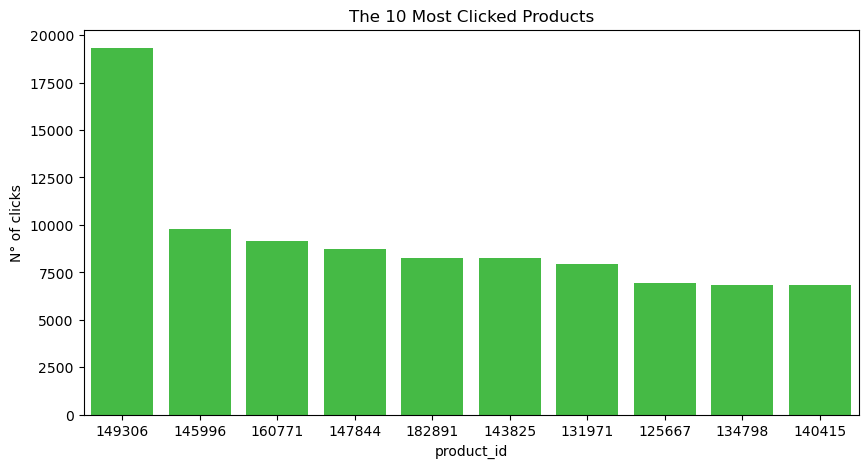

In [49]:
plt.figure(figsize=(10,5))
fig_top=sns.barplot(top_clicks.toPandas(), x="product_id", y="n_clicks", color="limegreen", order=top_clicks.toPandas().sort_values("n_clicks",ascending = False).product_id)
ple=fig_top.set_title("The 10 Most Clicked Products")
plt.ylabel("N° of clicks")

In [50]:
##N of products offered per seller

df_p_seller=spark.sql('''SELECT s.seller_name, count(*) AS n_products
          FROM sales_db.sellers_list s, (SELECT a.seller_id, a.product_id, count(*) 
          FROM sales_db.prices_competitor a
          GROUP BY a.seller_id, a.product_id
          ) ca
          WHERE s.seller_id=ca.seller_id
          GROUP BY s.seller_name
          ORDER BY n_products desc
          ''')

Text(0, 0.5, 'N° of products')

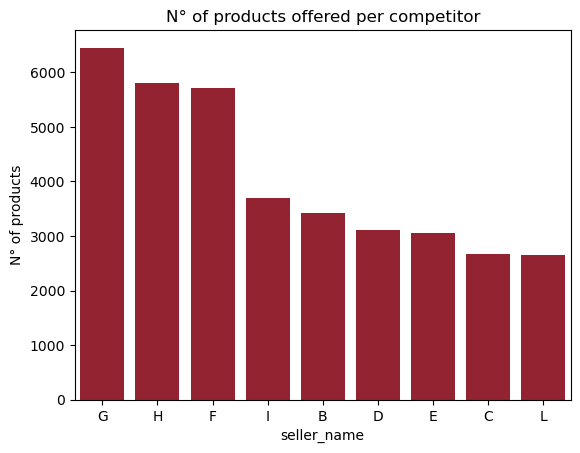

In [51]:
fig_p_seller=sns.barplot(df_p_seller.toPandas(), x="seller_name", y="n_products", color="#A61022", order=df_p_seller.toPandas().sort_values("n_products",ascending = False).seller_name)
ple=fig_p_seller.set_title("N° of products offered per competitor")
plt.ylabel("N° of products")

In [52]:
## N of products per macrocategory

p_per_cat= spark.sql('''SELECT a.coded_cat1, count(*) AS n_products
          FROM sales_db.product_catalog a
          GROUP BY a.coded_cat1''')

Text(0, 0.5, 'N° of products')

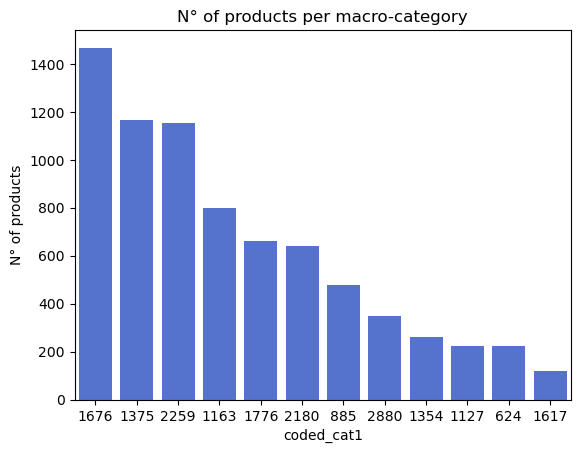

In [53]:
fig_p_cat=sns.barplot(p_per_cat.toPandas(), x="coded_cat1", y="n_products", color="royalblue", order=p_per_cat.toPandas().sort_values("n_products",ascending = False).coded_cat1)
ple=fig_p_cat.set_title("N° of products per macro-category")
plt.ylabel("N° of products")

### TASK 1

In [54]:
#QUERY CAT_1 1676

df_1676=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count(distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=1676 ORDER BY a.n_date desc LIMIT 1")
df_1676.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    139545|      1676|        9|  3293|
+----------+----------+---------+------+



In [55]:
##PRODUCT 139545
df_p1=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=139545 ORDER BY date")
df_p1.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       23|    139545|7990.0|
|2021-01-01|      180|    139545|7446.0|
|2021-01-01|       26|    139545|7990.0|
|2021-01-01|      188|    139545|7990.0|
|2021-01-01|      407|    139545|8990.0|
|2021-01-01|       24|    139545|7990.0|
|2021-01-01|       41|    139545|8000.0|
|2021-01-01|       48|    139545|7990.0|
|2021-01-02|       41|    139545|8000.0|
|2021-01-02|       23|    139545|7990.0|
|2021-01-02|       48|    139545|7990.0|
|2021-01-02|      180|    139545|7446.0|
|2021-01-02|      407|    139545|8990.0|
|2021-01-02|       24|    139545|7990.0|
|2021-01-02|      180|    139545|7890.0|
|2021-01-02|      188|    139545|7990.0|
|2021-01-02|       26|    139545|7990.0|
|2021-01-03|       23|    139545|7990.0|
|2021-01-03|       24|    139545|7990.0|
|2021-01-03|       26|    139545|7990.0|
+----------+---------+----------+------+
only showing top

In [56]:
graph_p1=px.line(data_frame=df_p1.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 139545")
graph_p1.show()

###By filtering sellers and timeframe on the graphs, a strong relationship among sellers n° 48,26,24 and 180 can be identified

In [57]:
#QUERY CAT_1 2259
df_2259=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=2259 ORDER BY a.n_date desc LIMIT 1")
df_2259.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    139038|      2259|        9|  3310|
+----------+----------+---------+------+



In [58]:
##PRODUCT 139038
df_p2=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=139038 ORDER BY date")
df_p2.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       41|    139038|2231.0|
|2021-01-01|      180|    139038|2099.0|
|2021-01-01|      407|    139038|1990.0|
|2021-01-01|       24|    139038|2559.0|
|2021-01-01|       23|    139038|2490.0|
|2021-01-01|       48|    139038|3290.0|
|2021-01-01|      188|    139038|1990.0|
|2021-01-01|       26|    139038|3290.0|
|2021-01-02|      180|    139038|2099.0|
|2021-01-02|      188|    139038|1990.0|
|2021-01-02|       23|    139038|2490.0|
|2021-01-02|      407|    139038|1990.0|
|2021-01-02|       41|    139038|2231.0|
|2021-01-02|      180|    139038|2459.0|
|2021-01-02|       48|    139038|3290.0|
|2021-01-02|       24|    139038|2559.0|
|2021-01-02|       26|    139038|3290.0|
|2021-01-03|       23|    139038|2490.0|
|2021-01-03|       41|    139038|2231.0|
|2021-01-03|       26|    139038|3290.0|
+----------+---------+----------+------+
only showing top

In [59]:
graph_p2=px.line(data_frame=df_p2.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 139038")
graph_p2.show()

In [60]:
#QUERY CAT_1 1375
df_1375=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=1375 ORDER BY a.n_date desc LIMIT 1")
df_1375.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    107693|      1375|        9|  3112|
+----------+----------+---------+------+



In [61]:
##PRODUCT 107693
df_p3=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=107693 ORDER BY date")
df_p3.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       48|    107693|4790.0|
|2021-01-01|      188|    107693|6990.0|
|2021-01-01|       41|    107693|5547.0|
|2021-01-01|       24|    107693|4799.0|
|2021-01-01|       23|    107693|4599.0|
|2021-01-01|       41|    107693|5602.0|
|2021-01-01|      180|    107693|4699.0|
|2021-01-01|       26|    107693|4790.0|
|2021-01-02|       48|    107693|4790.0|
|2021-01-02|       41|    107693|5658.0|
|2021-01-02|      180|    107693|4699.0|
|2021-01-02|       23|    107693|4599.0|
|2021-01-02|      188|    107693|6990.0|
|2021-01-02|       41|    107693|5602.0|
|2021-01-02|      180|    107693|4690.0|
|2021-01-02|       24|    107693|4799.0|
|2021-01-02|       26|    107693|4790.0|
|2021-01-03|       23|    107693|4599.0|
|2021-01-03|       41|    107693|5658.0|
|2021-01-03|       26|    107693|4790.0|
+----------+---------+----------+------+
only showing top

In [62]:
graph_p3=px.line(data_frame=df_p3.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 107693")
graph_p3.show()

In [63]:
#QUERY CAT_1 1776  ##EMPTY QUERY
df_1776=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=1776 ORDER BY a.n_date desc LIMIT 1")
df_1776.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
+----------+----------+---------+------+



In [64]:
#QUERY CAT_1 1127
df_1127=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=1127 ORDER BY a.n_date desc LIMIT 1")
df_1127.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    133528|      1127|        9|  2951|
+----------+----------+---------+------+



In [65]:
##PRODUCT 133528
df_p4=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=133528 ORDER BY date")
df_p4.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       26|    133528|1790.0|
|2021-01-01|       23|    133528|2799.0|
|2021-01-01|       41|    133528|2990.0|
|2021-01-01|       24|    133528|2790.0|
|2021-01-01|       48|    133528|2790.0|
|2021-01-01|      180|    133528|2499.0|
|2021-01-01|      188|    133528|2490.0|
|2021-01-02|       24|    133528|2790.0|
|2021-01-02|      180|    133528|2499.0|
|2021-01-02|       23|    133528|2799.0|
|2021-01-02|      188|    133528|2490.0|
|2021-01-02|       48|    133528|2790.0|
|2021-01-02|       41|    133528|2990.0|
|2021-01-02|       26|    133528|1790.0|
|2021-01-03|       41|    133528|2990.0|
|2021-01-03|      188|    133528|2490.0|
|2021-01-03|       48|    133528|2790.0|
|2021-01-03|       24|    133528|2790.0|
|2021-01-03|      180|    133528|2499.0|
|2021-01-03|       23|    133528|2799.0|
+----------+---------+----------+------+
only showing top

In [66]:
graph_p4=px.line(data_frame=df_p3.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 133528")
graph_p4.show()

In [67]:
#QUERY CAT_1 1163
df_1163=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=1163 ORDER BY a.n_date desc LIMIT 1")
df_1163.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    132575|      1163|        9|  2427|
+----------+----------+---------+------+



In [68]:
#PRODUCT 132575
df_p5=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=132575 ORDER BY date")
df_p5.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       41|    132575|2490.0|
|2021-01-01|       26|    132575|2990.0|
|2021-01-01|       24|    132575|2990.0|
|2021-01-01|      180|    132575|2724.0|
|2021-01-01|       48|    132575|2990.0|
|2021-01-01|      188|    132575|2690.0|
|2021-01-02|       41|    132575|2490.0|
|2021-01-02|       23|    132575|3490.0|
|2021-01-02|       24|    132575|2990.0|
|2021-01-02|      180|    132575|2724.0|
|2021-01-02|      180|    132575|2890.0|
|2021-01-02|      188|    132575|2690.0|
|2021-01-02|       48|    132575|2990.0|
|2021-01-03|       23|    132575|3490.0|
|2021-01-03|       24|    132575|2990.0|
|2021-01-03|      180|    132575|2890.0|
|2021-01-03|       41|    132575|2490.0|
|2021-01-03|      188|    132575|2690.0|
|2021-01-04|       41|    132575|2490.0|
|2021-01-04|       24|    132575|2990.0|
+----------+---------+----------+------+
only showing top

In [69]:
graph_p5=px.line(data_frame=df_p5.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 132575")
graph_p5.show()

In [70]:
#QUERY CAT_1 1354
df_1354=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=1354 ORDER BY a.n_date desc LIMIT 1")
df_1354.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    148202|      1354|        9|  2893|
+----------+----------+---------+------+



In [71]:
#PRODUCT 148202
df_p6=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=148202 ORDER BY date")
df_p6.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       48|    148202|7990.0|
|2021-01-01|       23|    148202|7999.0|
|2021-01-01|       24|    148202|7990.0|
|2021-01-01|      188|    148202|7990.0|
|2021-01-01|       41|    148202|6900.0|
|2021-01-01|       26|    148202|7990.0|
|2021-01-01|      180|    148202|6800.0|
|2021-01-02|       24|    148202|7990.0|
|2021-01-02|       41|    148202|6900.0|
|2021-01-02|       23|    148202|7999.0|
|2021-01-02|      180|    148202|6800.0|
|2021-01-02|       48|    148202|7990.0|
|2021-01-02|      188|    148202|7990.0|
|2021-01-02|       26|    148202|7990.0|
|2021-01-03|      188|    148202|7990.0|
|2021-01-03|       23|    148202|7999.0|
|2021-01-03|       48|    148202|7990.0|
|2021-01-03|      180|    148202|6800.0|
|2021-01-03|       26|    148202|7990.0|
|2021-01-03|       41|    148202|6900.0|
+----------+---------+----------+------+
only showing top

In [72]:
graph_p6=px.line(data_frame=df_p6.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 148202")
graph_p6.show()

In [73]:
#QUERY CAT_1 2180
df_2180=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=2180 ORDER BY a.n_date desc LIMIT 1")
df_2180.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    135173|      2180|        9|  3291|
+----------+----------+---------+------+



In [74]:
#PRODUCT 135173
df_p7=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=135173 ORDER BY date")
df_p7.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|      188|    135173|3990.0|
|2021-01-01|       41|    135173|3480.0|
|2021-01-01|      407|    135173|3490.0|
|2021-01-01|       48|    135173|4443.0|
|2021-01-01|       23|    135173|3999.0|
|2021-01-01|       26|    135173|3999.0|
|2021-01-01|      180|    135173|3390.0|
|2021-01-02|      180|    135173|3390.0|
|2021-01-02|      180|    135173|3490.0|
|2021-01-02|      188|    135173|3990.0|
|2021-01-02|       26|    135173|3999.0|
|2021-01-02|       48|    135173|4443.0|
|2021-01-02|      407|    135173|3490.0|
|2021-01-02|       23|    135173|3999.0|
|2021-01-02|       41|    135173|3480.0|
|2021-01-03|       23|    135173|3999.0|
|2021-01-03|       26|    135173|3999.0|
|2021-01-03|       41|    135173|3480.0|
|2021-01-03|      180|    135173|3490.0|
|2021-01-03|       48|    135173|4443.0|
+----------+---------+----------+------+
only showing top

In [75]:
graph_p7=px.line(data_frame=df_p7.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 135173")
graph_p7.show()

In [76]:
#QUERY CAT_1 2880
df_2880=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=2880 ORDER BY a.n_date desc LIMIT 1")
df_2880.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    160792|      2880|        9|  2793|
+----------+----------+---------+------+



In [77]:
#PRODUCT 160792
df_p8=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=160792 ORDER BY date")
df_p8.show()

+----------+---------+----------+-------+
|      date|seller_id|product_id|  price|
+----------+---------+----------+-------+
|2021-01-01|      180|    160792|14690.0|
|2021-01-01|      407|    160792|21990.0|
|2021-01-02|      180|    160792|14690.0|
|2021-01-02|      407|    160792|21990.0|
|2021-01-03|      180|    160792|14690.0|
|2021-01-03|      407|    160792|21990.0|
|2021-01-04|      180|    160792|14690.0|
|2021-01-04|      407|    160792|21990.0|
|2021-01-05|      180|    160792|14690.0|
|2021-01-05|      407|    160792|21990.0|
|2021-01-06|      407|    160792|21990.0|
|2021-01-06|      180|    160792|14690.0|
|2021-01-07|      180|    160792|14690.0|
|2021-01-07|      407|    160792|21990.0|
|2021-01-08|      180|    160792|14690.0|
|2021-01-08|      407|    160792|21990.0|
|2021-01-09|      407|    160792|21990.0|
|2021-01-09|      180|    160792|14690.0|
|2021-01-10|      180|    160792|14690.0|
|2021-01-10|      407|    160792|21990.0|
+----------+---------+----------+-

In [78]:
graph_p8=px.line(data_frame=df_p8.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 160792")
graph_p8.show()

In [79]:
#QUERY CAT_1 1617
df_1617=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=1617 ORDER BY a.n_date desc LIMIT 1")
df_1617.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    140647|      1617|        9|  2163|
+----------+----------+---------+------+



In [80]:
#PRODUCT 140647
df_p9=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=140647 ORDER BY date")
df_p9.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       23|    140647|3299.0|
|2021-01-01|      188|    140647|2990.0|
|2021-01-01|       24|    140647|3290.0|
|2021-01-01|       26|    140647|3290.0|
|2021-01-01|       48|    140647|3290.0|
|2021-01-01|      180|    140647|2999.0|
|2021-01-02|       26|    140647|3290.0|
|2021-01-02|       48|    140647|3290.0|
|2021-01-02|       24|    140647|3290.0|
|2021-01-02|       23|    140647|3299.0|
|2021-01-02|      188|    140647|2990.0|
|2021-01-02|      180|    140647|2999.0|
|2021-01-03|      188|    140647|2990.0|
|2021-01-03|       23|    140647|3299.0|
|2021-01-03|       26|    140647|3290.0|
|2021-01-03|       24|    140647|3290.0|
|2021-01-03|      180|    140647|2999.0|
|2021-01-03|       48|    140647|3290.0|
|2021-01-04|       26|    140647|3290.0|
|2021-01-04|       24|    140647|3290.0|
+----------+---------+----------+------+
only showing top

In [81]:
graph_p9=px.line(data_frame=df_p9.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 140647")
graph_p9.show()

In [82]:
#QUERY CAT_1 885
df_885=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=885 ORDER BY a.n_date desc LIMIT 1")
df_885.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    103455|       885|        9|  2890|
+----------+----------+---------+------+



In [83]:
#PRODUCT 103455
df_p10=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=103455 ORDER BY date")
df_p10.show()

+----------+---------+----------+------+
|      date|seller_id|product_id| price|
+----------+---------+----------+------+
|2021-01-01|       23|    103455|3999.0|
|2021-01-01|       24|    103455|3990.0|
|2021-01-01|       41|    103455|3890.0|
|2021-01-01|      188|    103455|3990.0|
|2021-01-02|       24|    103455|3990.0|
|2021-01-02|      188|    103455|3990.0|
|2021-01-02|       23|    103455|3999.0|
|2021-01-02|       41|    103455|3890.0|
|2021-01-03|      188|    103455|3990.0|
|2021-01-03|       23|    103455|3999.0|
|2021-01-03|       24|    103455|3990.0|
|2021-01-03|       41|    103455|3890.0|
|2021-01-04|       24|    103455|3990.0|
|2021-01-04|       23|    103455|3999.0|
|2021-01-04|      188|    103455|3990.0|
|2021-01-04|       41|    103455|3890.0|
|2021-01-05|       41|    103455|3890.0|
|2021-01-05|      188|    103455|3990.0|
|2021-01-05|       23|    103455|3999.0|
|2021-01-05|       24|    103455|3990.0|
+----------+---------+----------+------+
only showing top

In [84]:
graph_p10=px.line(data_frame=df_p10.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 103455")
graph_p10.show()

In [85]:
#QUERY CAT_1 624
df_624=spark.sql("SELECT * FROM (SELECT p.product_id, pc.coded_cat1, count( distinct p.seller_id) as n_sellers, count(p.product_id) as n_date FROM sales_db.prices_competitor p, sales_db.product_catalog pc WHERE p.product_id=pc.product_id GROUP BY p.product_id, pc.coded_cat1 ORDER BY n_sellers desc) a WHERE a.n_sellers=9 AND a.coded_cat1=624 ORDER BY a.n_date desc LIMIT 1")
df_624.show()

+----------+----------+---------+------+
|product_id|coded_cat1|n_sellers|n_date|
+----------+----------+---------+------+
|    158032|       624|        9|  2385|
+----------+----------+---------+------+



In [86]:
#PRODUCT 158032
df_p11=spark.sql("SELECT p.comp_date as date, p.seller_id, p.product_id, p.price FROM sales_db.prices_competitor p WHERE p.product_id=158032 ORDER BY date")
df_p11.show()

+----------+---------+----------+-------+
|      date|seller_id|product_id|  price|
+----------+---------+----------+-------+
|2021-01-01|       41|    158032|45990.0|
|2021-01-01|       23|    158032|54999.0|
|2021-01-02|       23|    158032|54999.0|
|2021-01-02|       41|    158032|45990.0|
|2021-01-03|       23|    158032|54999.0|
|2021-01-03|       41|    158032|45990.0|
|2021-01-04|       23|    158032|54999.0|
|2021-01-04|       41|    158032|45990.0|
|2021-01-05|       23|    158032|54999.0|
|2021-01-05|       41|    158032|45990.0|
|2021-01-06|       23|    158032|54999.0|
|2021-01-06|       41|    158032|45990.0|
|2021-01-07|       23|    158032|54999.0|
|2021-01-07|       41|    158032|45990.0|
|2021-01-08|       23|    158032|54999.0|
|2021-01-08|       41|    158032|45990.0|
|2021-01-09|       23|    158032|54999.0|
|2021-01-09|       41|    158032|45990.0|
|2021-01-10|       23|    158032|54999.0|
|2021-01-10|       41|    158032|45990.0|
+----------+---------+----------+-

In [87]:
graph_p11=px.line(data_frame=df_p11.toPandas(), x="date", y="price", color="seller_id", title="Price History - Product 158032")
graph_p11.show()

### TASK 2

In [88]:
###Querying from clicks the number of daily clicks per product, the number of total clicks in a day, 
##the daily rank based on clicks of every product (in ascending order, so the product ranked first is the one with the fewest clicks)
##and the rank of the day based on the total clicks compared with the number of clicks registered by the others (in ascending order)

df_clicks=spark.sql(''' WITH clicks as (SELECT a.date, a.product_id, a.n_clicks, 
          SUM(a.n_clicks) OVER (PARTITION BY a.date) AS total_daily_clicks, RANK() OVER(PARTITION BY a.date ORDER BY a.n_clicks) AS asc_daily_rank
          FROM (SELECT date(c.date) AS date, c.product_id, COUNT(c.product_id) n_clicks 
          FROM sales_db.clicks c
          WHERE date(c.date) LIKE "2021%"
          GROUP BY date(c.date), c.product_id) a)
          SELECT cl.date, cl.product_id, cl.n_clicks, cl.total_daily_clicks, cl.asc_daily_rank, 
          DENSE_RANK() OVER(ORDER BY cl.total_daily_clicks) AS asc_rank_days
          FROM clicks cl
          ORDER BY cl.date, cl.n_clicks DESC ''')

In [89]:
df_clicks.show()

+----------+----------+--------+------------------+--------------+-------------+
|      date|product_id|n_clicks|total_daily_clicks|asc_daily_rank|asc_rank_days|
+----------+----------+--------+------------------+--------------+-------------+
|2021-01-01|    134798|      50|              3229|          1246|            3|
|2021-01-01|    149306|      40|              3229|          1245|            3|
|2021-01-01|    154311|      25|              3229|          1244|            3|
|2021-01-01|    157707|      23|              3229|          1242|            3|
|2021-01-01|    154812|      23|              3229|          1242|            3|
|2021-01-01|    136973|      22|              3229|          1241|            3|
|2021-01-01|    154215|      21|              3229|          1240|            3|
|2021-01-01|    132392|      19|              3229|          1237|            3|
|2021-01-01|    145996|      19|              3229|          1237|            3|
|2021-01-01|    147844|     

In [90]:
##Scaling the ranks (0 to 1 values, the highest values correspond to the the products/days with more clicks )

from pyspark.ml.feature import MinMaxScaler
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler

##Scaling the clicks rank
assembler = VectorAssembler(inputCols=["asc_daily_rank"], outputCol="asc_daily_rank_vector")
scaler = MinMaxScaler(inputCol="asc_daily_rank_vector", outputCol="asc_daily_rank_norm")
pipe = Pipeline(stages=[assembler, scaler])
scalerM = pipe.fit(df_clicks)
df_clicks = scalerM.transform(df_clicks).drop("asc_daily_rank_vector")

In [92]:
##Scaling the days rank
assembler_2 = VectorAssembler(inputCols=["asc_rank_days"], outputCol="asc_rank_days_vector")
scaler_2 = MinMaxScaler(inputCol="asc_rank_days_vector", outputCol="asc_rank_days_norm")
pipe_2 = Pipeline(stages=[assembler_2, scaler_2])
scalerM_2 = pipe_2.fit(df_clicks)
df_clicks = scalerM_2.transform(df_clicks).drop("asc_rank_days_vector")

In [93]:
##Converting the resulting vectors to arrays and then to simple floats
from pyspark.ml.functions import vector_to_array
df_clicks=df_clicks.withColumn('asc_rank_days_norm', vector_to_array('asc_rank_days_norm'))
df_clicks=df_clicks.withColumn("asc_rank_days_norm",df_clicks.asc_rank_days_norm[0])

df_clicks=df_clicks.withColumn('asc_daily_rank_norm', vector_to_array('asc_daily_rank_norm'))
df_clicks=df_clicks.withColumn("asc_daily_rank_norm",df_clicks.asc_daily_rank_norm[0])

In [94]:
df_clicks.show()

+----------+----------+--------+------------------+--------------+-------------+-------------------+--------------------+
|      date|product_id|n_clicks|total_daily_clicks|asc_daily_rank|asc_rank_days|asc_daily_rank_norm|  asc_rank_days_norm|
+----------+----------+--------+------------------+--------------+-------------+-------------------+--------------------+
|2021-01-01|    134798|      50|              3229|          1246|            3| 0.4287190082644628|0.005830903790087...|
|2021-01-01|    149306|      40|              3229|          1245|            3| 0.4283746556473829|0.005830903790087...|
|2021-01-01|    154311|      25|              3229|          1244|            3|0.42803030303030304|0.005830903790087...|
|2021-01-01|    157707|      23|              3229|          1242|            3| 0.4273415977961433|0.005830903790087...|
|2021-01-01|    154812|      23|              3229|          1242|            3| 0.4273415977961433|0.005830903790087...|
|2021-01-01|    136973| 

In [95]:
##Defining the popularity index function
import math
def popularity_index (row):
    return math.exp(row["asc_daily_rank_norm"])+ row["asc_rank_days_norm"]

In [96]:
##Converting the pyspark dataframe into a pandas dataframe
df_clicks_pd=df_clicks.toPandas()

In [97]:
df_clicks_pd

,date,product_id,n_clicks,total_daily_clicks,asc_daily_rank,asc_rank_days,asc_daily_rank_norm,asc_rank_days_norm
0,2021-01-01,134798,50,3229,1246,3,0.428719,0.005831
1,2021-01-01,149306,40,3229,1245,3,0.428375,0.005831
2,2021-01-01,154311,25,3229,1244,3,0.428030,0.005831
3,2021-01-01,157707,23,3229,1242,3,0.427342,0.005831
4,2021-01-01,154812,23,3229,1242,3,0.427342,0.005831
...,...,...,...,...,...,...,...,...
615565,2021-12-31,145189,1,3321,1,5,0.000000,0.011662
615566,2021-12-31,132478,1,3321,1,5,0.000000,0.011662
615567,2021-12-31,154613,1,3321,1,5,0.000000,0.011662
615568,2021-12-31,156987,1,3321,1,5,0.000000,0.011662


In [98]:
##Applying the popularity index function to create a new column in the dataframe
df_clicks_pd["popularity_index"]= df_clicks_pd.apply(lambda row: popularity_index(row), axis=1)

In [99]:
##Normalizing the index (0 to 1 values)
from sklearn import preprocessing
df_clicks_pd["popularity_index"] = (df_clicks_pd["popularity_index"] - df_clicks_pd["popularity_index"].min()) / (df_clicks_pd["popularity_index"].max() - df_clicks_pd["popularity_index"].min())

In [100]:
df_clicks_pd

,date,product_id,n_clicks,total_daily_clicks,asc_daily_rank,asc_rank_days,asc_daily_rank_norm,asc_rank_days_norm,popularity_index
0,2021-01-01,134798,50,3229,1246,3,0.428719,0.005831,0.199067
1,2021-01-01,149306,40,3229,1245,3,0.428375,0.005831,0.198873
2,2021-01-01,154311,25,3229,1244,3,0.428030,0.005831,0.198678
3,2021-01-01,157707,23,3229,1242,3,0.427342,0.005831,0.198290
4,2021-01-01,154812,23,3229,1242,3,0.427342,0.005831,0.198290
...,...,...,...,...,...,...,...,...,...
615565,2021-12-31,145189,1,3321,1,5,0.000000,0.011662,0.004290
615566,2021-12-31,132478,1,3321,1,5,0.000000,0.011662,0.004290
615567,2021-12-31,154613,1,3321,1,5,0.000000,0.011662,0.004290
615568,2021-12-31,156987,1,3321,1,5,0.000000,0.011662,0.004290


Text(0, 0.5, 'N° of products')

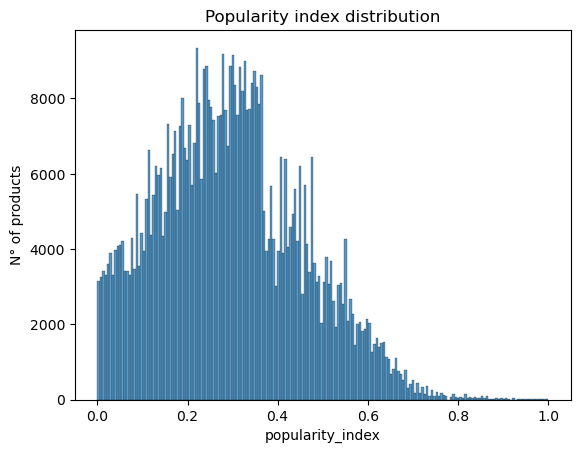

In [101]:
##Plotting the distribution of the index
fig_dis=sns.histplot(data=df_clicks_pd, x="popularity_index")
dis=fig_dis.set_title("Popularity index distribution")
plt.ylabel("N° of products")

In [102]:
##Defining the function to divide the dates in quarters
def t_bin(x):
    q1 = '2021-04-01'
    q2 = '2021-07-01'
    q3 = '2021-10-01'
    if x < pd.to_datetime(q1):
        return "Q1"
    elif x < pd.to_datetime(q2):
        return "Q2"
    elif x < pd.to_datetime(q3):
        return "Q3"
    else:
        return "Q4"

In [103]:
#Defining the function to filter the Black Friday timeframe

def blackfriday(x):
    start = '2021-11-01'
    end = '2021-11-30'
    if x >= pd.to_datetime(start) and x <= pd.to_datetime(end):
        return 1
    else:
        return 0

In [ ]:
#Applying the first function to a new column in the df
df_clicks_pd["Qs"] = df_clicks_pd['date'].apply(lambda row:t_bin(row))

C:\Users\maria\AppData\Local\Temp\ipykernel_2000\1619273549.py:6: FutureWarning:

Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.

C:\Users\maria\AppData\Local\Temp\ipykernel_2000\1619273549.py:8: FutureWarning:

Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.

C:\Users\maria\AppData\Local\Temp\ipykernel_2000\1619273549.py:10: FutureWarning:

Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.



In [ ]:
#Applying the second function to a new column in the df
df_clicks_pd["BlackFriday"] = df_clicks_pd['date'].apply(lambda row:blackfriday(row))

In [ ]:
##Grouping the rows in order to compute the mean of each product's popularity index in the various quarters
df_grouped = pd.DataFrame(df_clicks_pd.groupby(['product_id', 'Qs'])['popularity_index'].mean())

In [ ]:
df_grouped

In [ ]:
#Resetting the index
df_clicks_pd_grouped = df_grouped.reset_index()
df_clicks_pd_grouped

In [ ]:
##Sorting the rows in order to find the top 5 products by popularity in Q1 
df_clicks_pd_grouped[df_clicks_pd_grouped["Qs"]=="Q1"].sort_values(by="popularity_index", ascending= False)

In [ ]:
##Sorting the rows in order to find the top 5 products by popularity in Q2
df_clicks_pd_grouped[df_clicks_pd_grouped["Qs"]=="Q2"].sort_values(by="popularity_index", ascending= False)

In [ ]:
##Sorting the rows in order to find the top 5 products by popularity in Q3
df_clicks_pd_grouped[df_clicks_pd_grouped["Qs"]=="Q3"].sort_values(by="popularity_index", ascending= False)

In [ ]:
##Sorting the rows in order to find the top 5 products by popularity in Q4
df_clicks_pd_grouped[df_clicks_pd_grouped["Qs"]=="Q4"].sort_values(by="popularity_index", ascending= False)

In [ ]:
##Filtering the df to select only the Black Friday timeframe
df_black_f = df_clicks_pd[df_clicks_pd['BlackFriday'] == 1]

In [ ]:
##Grouping the rows in order to compute the mean of each product's popularity index in the timeframe
df_bf_grouped = pd.DataFrame(df_black_f.groupby('product_id')['popularity_index'].mean())
df_bf_grouped

In [ ]:
#Resetting the index
df_black_friday= df_bf_grouped.reset_index()

In [ ]:
#Sorting the rows in order to find the top 5 products by popularity during the Black Friday period
df_black_friday=df_black_friday.sort_values(by="popularity_index", ascending= False)
df_black_friday.head(10)

In [ ]:
##spark.stop() ##Uncomment to close Spark